# Image Processing Techniques to Perform Descriptive Analytics and Preprocessing of Urban and Rural Rotterdam Satellite Image Map Tiles
<img src='img/SpaceNet.png'>

## 1. Executive Summary

By applying descriptive analytics through pyspark on AWS, the authors were able to determine various building densities within Rotterdam through different maptiles within the SpaceNet6 dataset. 57% of the tiles contained a building density categorized as rural, 37% contained a density categorized as suburban, and 6% contained a density categorized as urban. By applying Otsu and Li Thresholding, we are able to preprocess the map tiles in the dataset prior to running blob detection to identify the number of possible structures.

## 2. Problem Statement

How might we distinguish differences in levels of urbanization within map tiles in terms of image features?

## 3. Motivation

### Image Datasets
Satellite image datasets are large in nature due to keeping the most amount of detail as possible. Therefore, a methodology to produce preprocessing steps for images specific to an important predetermined feature such as local and urban areas can reduce more work along the pipeline such as image classification or object detection. Using certain image processing techniques may be easier to explain to stakeholders and decision-maker when it concerns initial analysis of geographical image data.

### Rotterdam
One of the main reasons for the interest in Rotterdam, Netherlands is that it is the largest seaport in Europe with benefiting several countries and their economies. This has earned it the nickname "Gateway to Europe" and "Gateway to the World".

<img src='img/rotterdam.jpg'>

<center><b>Figure 1.</b> Rotterdam and the Euromast.</center>

## 4. Data Source

SpaceNet (https://spacenet.ai/), launched in August 2016 as an open innovation project offering a repository of freely available imagery with co-registered map features. Before SpaceNet, computer vision researchers had minimal options to obtain free, precision-labeled, and high-resolution satellite imagery. Today, SpaceNet hosts datasets developed by its own team, along with data sets from projects like IARPA’s Functional Map of the World (fMoW).

For this project, the authors will be using SpaceNet6 (https://spacenet.ai/sn6-challenge/) which contains over 120 square kilometers of high resolution images with over 48,000 buildings of Rotterdam in the Netherlands (https://spacenet.ai/rotterdam/). This is contained in processed 450mx450m tiles amounting to over 39.0GB which comes in different forms such as SAR, RGB, RGBNIR images, geojson, and building footprint locations.

To load the dataset, we first determine the packages and modules available on Spark.

In [1]:
print(sc.list_packages())

VBox()

Starting Spark application


ID,YARN Application ID,Kind,State,Spark UI,Driver log,Current session?
4,application_1646575917358_0006,pyspark,idle,Link,Link,✔


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

SparkSession available as 'spark'.


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

aiobotocore (2.1.2)
aiohttp (3.8.1)
aioitertools (0.10.0)
aiosignal (1.2.0)
async-timeout (4.0.2)
asynctest (0.13.0)
attrs (21.4.0)
aws-cfn-bootstrap (2.0)
beautifulsoup4 (4.9.3)
boto (2.49.0)
boto3 (1.21.13)
botocore (1.24.13)
certifi (2021.10.8)
charset-normalizer (2.0.12)
click (8.0.3)
click-plugins (1.1.1)
cligj (0.7.2)
cycler (0.11.0)
docutils (0.14)
Fiona (1.8.21)
fonttools (4.29.1)
frozenlist (1.3.0)
fsspec (2022.2.0)
geopandas (0.10.2)
idna (3.3)
imageio (2.16.1)
importlib-metadata (4.11.2)
jmespath (0.10.0)
joblib (1.1.0)
kiwisolver (1.3.2)
lockfile (0.11.0)
lxml (4.6.3)
matplotlib (3.5.1)
multidict (6.0.2)
munch (2.5.0)
mysqlclient (1.4.2)
networkx (2.6.3)
nltk (3.6.5)
nose (1.3.4)
numpy (1.21.5)
opencv-python (4.5.5.62)
packaging (21.3)
pandas (1.3.5)
Pillow (9.0.1)
pip (9.0.1)
py-dateutil (2.2)
pyparsing (3.0.7)
pyproj (3.2.1)
pystache (0.5.4)
python-daemon (2.2.3)
python-dateutil (2.8.2)
python37-sagemaker-pyspark (1.4.1)
pytz (2021.3)
PyWavelets (1.2.0)
PyYAML (5.4.1)
reg

In [2]:
import cv2, re
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

import skimage
from skimage import filters
from skimage.color import rgba2rgb, rgb2gray
from skimage.measure import label, regionprops
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.morphology import erosion, dilation, opening, closing
from pyspark.sql.types import StructType, StructField
from pyspark.sql.types import StringType, IntegerType, FloatType

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

### Directory of Files in SpaceNet Challenge 6

Below is the directory of the SpaceNet Challenge 6 dataset.
<img src='img/directory.png'>

The dataset contains a csv file containing details and ground truths on buildings since this dataset was used for a building detection challenge specifically. Notably, one of the columns represents a polygon of the building therefore, this can be exported as a Geopandas Dataframe to preserve this geometry.

In [3]:
file = 's3://lab2-bdcc2022/AOI_11_Rotterdam/SummaryData/'
path = 'SN6_Train_AOI_11_Rotterdam_Buildings.csv'

csvSchema = StructType([
    StructField('ImageId', StringType(), False), 
    StructField('TileBuildingId', IntegerType(), False),
    StructField('PolygonWKT_Pix', StringType(), False),
    StructField('Mean_Building_Height', FloatType(), False), 
    StructField('Median_Building_Height', FloatType(), False),
    StructField('StdDev_Building_Height', FloatType(), False),])

(spark.read.format("csv").option("header","true")
 .schema(csvSchema).load(file + path)).printSchema()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

root
 |-- ImageId: string (nullable = true)
 |-- TileBuildingId: integer (nullable = true)
 |-- PolygonWKT_Pix: string (nullable = true)
 |-- Mean_Building_Height: float (nullable = true)
 |-- Median_Building_Height: float (nullable = true)
 |-- StdDev_Building_Height: float (nullable = true)

Below is the summary data for all the buildings. Let us use a more visual approach to explore the data.

In [4]:
path = 's3://lab2-bdcc2022/AOI_11_Rotterdam/SummaryData/'
file = 'SN6_Train_AOI_11_Rotterdam_Buildings.csv'

summary_data = pd.read_csv(path + file)
summary_data

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

                                        ImageId  ...  StdDev_Building_Height
0       20190822070610_20190822070846_tile_3721  ...                0.006495
1       20190822070610_20190822070846_tile_3721  ...                0.000000
2       20190822070610_20190822070846_tile_3721  ...                0.000000
3       20190822070610_20190822070846_tile_3721  ...                0.000000
4       20190822070610_20190822070846_tile_3721  ...                0.000000
...                                         ...  ...                     ...
214677  20190822133333_20190822133635_tile_7758  ...                0.000000
214678  20190822133333_20190822133635_tile_7758  ...                0.000000
214679  20190822133333_20190822133635_tile_7758  ...                0.000000
214680  20190822133333_20190822133635_tile_7758  ...                0.000000
214681  20190822133333_20190822133635_tile_7758  ...                0.000000

[214682 rows x 6 columns]

## 5. Data Exploration

1. **Overview** - The dataset contains 2 summary files and 3401 map tiles in PAN, PS-RGB, PS-RBGNIR, RGBNIR, and SAR-Intensity mediums.


2. **Summary File** - The dataset has a csv file named SN6_Train_AOI_11_Rotterdam_Buildings.csv with details on the image tiles which we used as the ground truth to guide the development of our methodology. The csv files has the following columns: ImageID, TileBuildingId, PolygonWKT_Pix, Mean_Building_Height, Median_Building_Height, Std_Building_Height.


3. **Map Tiles** - For this project, the authors will be focusing on the RGB3 3-band pan-sharpened imagery (PS-RGB) map files which depict the satellite imagery in RGB colors.


### 5.1 Rotterdam Building Heights

The distribution of building heights were plotted to get a sense of the distribution of on building heights.

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

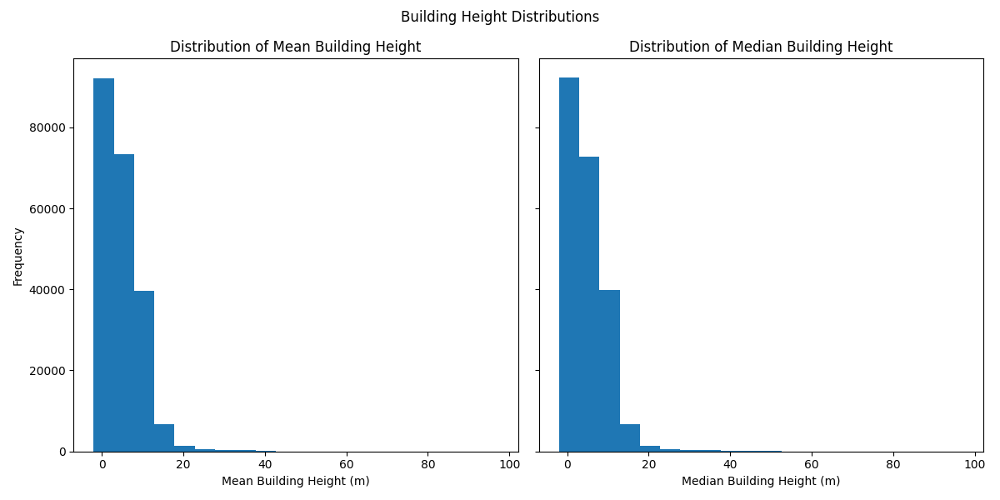

In [5]:
plt.clf()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharey=True)
fig.suptitle('Building Height Distributions')

ax1.hist(summary_data['Mean_Building_Height'], bins=20)
ax1.set_xlabel('Mean Building Height (m)')
ax1.set_ylabel('Frequency')
ax1.set_title('Distribution of Mean Building Height')

ax2.hist(summary_data['Median_Building_Height'], bins=20)
ax2.set_xlabel('Median Building Height (m)')
ax2.set_title('Distribution of Median Building Height')

fig.tight_layout()
plt.show()
%matplot plt

<center><b>Figure 2. </b>Mean and Median building heights have similar distributions. Majority of buildings have small building heights which implies a large amount of residential areas and a smaller amount of taller building which may be skyscrapers and tall structures.</center>

### 5.2 Distribution of Buildings Per Tile

The distribution of buildings per tile were plotted to get a sense of the distribution of among the tiles.

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

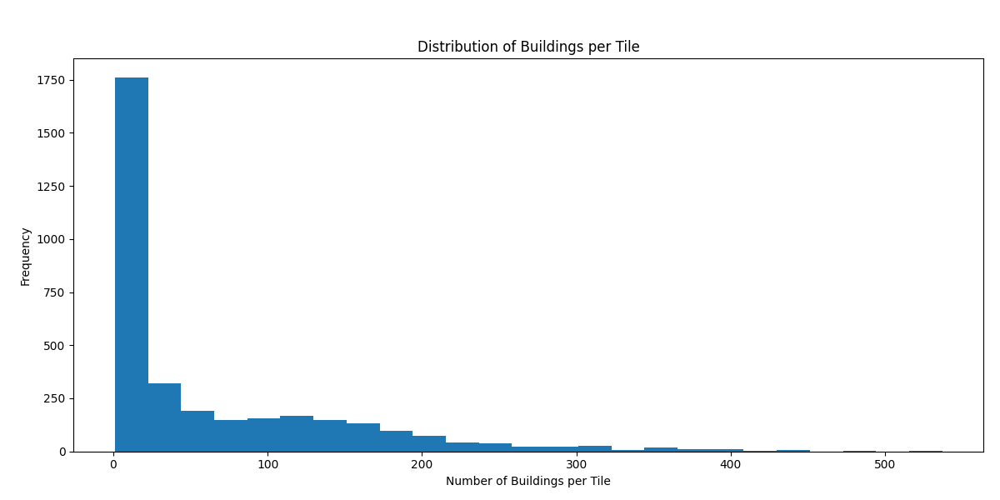

In [6]:
plt.clf()
plt.hist(summary_data.groupby('ImageId')['TileBuildingId'].count(), bins=25)
plt.xlabel('Number of Buildings per Tile')
plt.ylabel('Frequency')
plt.title('Distribution of Buildings per Tile')
plt.show()
%matplot plt

<center><b>Figure 3. </b>The distribution of buildings are mostly concentrated on low values. This could possibly mean a large portion of the lang mass is rural.</center>

### 5.3 Density of Rotterdam Buildings

Through the distributions we created segments of the image tiles and separated them into rural, suburban, and urban categories based on the density of the buildings per tile. The elbow points signify a change in the slope of the density and therefore a different category of urbanization. This allows us to load the dataset separately depending on the level of urbanization.

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

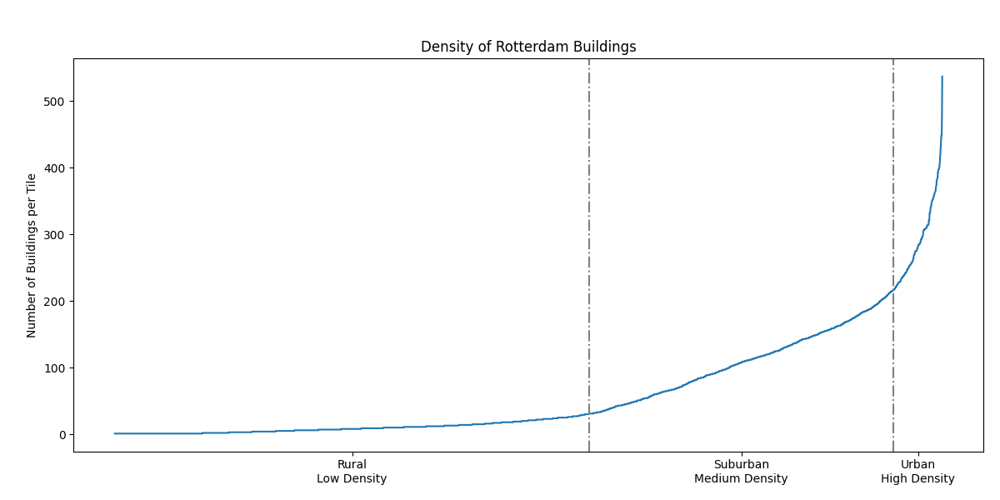

In [7]:
tiles_buildings = (summary_data.groupby('ImageId')['TileBuildingId']
                   .count().reset_index())

plt.clf()
plt.plot(range(0, tiles_buildings.shape[0]),
         tiles_buildings['TileBuildingId'].sort_values().values)
plt.ylabel('Number of Buildings per Tile')
plt.title('Density of Rotterdam Buildings')
plt.axvline(1950, c='gray', linestyle='-.')
plt.axvline(3200, c='gray', linestyle='-.')
plt.xticks([np.mean([0, 1950]), np.mean([1950, 3200]),
            np.mean([3200, tiles_buildings.shape[0]])],
           ['Rural\nLow Density', 'Suburban\nMedium Density',
            'Urban\nHigh Density'])
plt.show()
%matplot plt

<center><b>Figure 4. </b>The number of buildings per tile were used to categorize the map tiles into rural for low number of building density, suburban for a medium number, and urban for a high density.</center>

## 6. Methodology

<img src='img/methodology.png'>

### 6.1 AWS Setup

1. In this study, the authors utilized the following AWS services: S3, EC2, EBS, and EMR


2. We created an EC2 Instance with 900GB EBS to facilitate tasks.

3. The AWS CLI was used to copy the dataset in the tar.gz format from the SpaceNet S3 Bucket into our project’s S3 Bucket. The dataset is 39GB zipped so the EBS will need more than that.
<img src='img/console.png'>
<center><b>Figure 5. </b>The SpaceNet dataset used is 39GB zipped.</center>


4. The dataset was then copied from the personal S3 Bucket into the EBS using the EC2 Instance to be unzipped then the unzipped files were copied back into the S3 bucket
<img src='img/aoi.png'>
<center><b>Figure 6. </b>The S3 bucket used containing the unzipped file.</center>


5. An EMR Cluster was then initialized to begin with the analytics activities. It used 1 master and 5 core instances of m5.xlarge with a maximum of 16GB and a root EBS volume of 100GB.
<img src='img/emr.png'>
<center><b>Figure 7. </b>The EMR cluster used. It contains 1 master and 5 core nodes.</center>

6. Packages were installed suing the console on Maser and Slave instances instead of the notebooks because of version conflicts
- pip==22.0.3
- opencv-python
- numpy==1.21.5
- matplotlib
- scikit-image
- pandas
- geopandas
- shapely
- fsspec
- s3fs
- boto3


### 6.2 Load Rotterdam RGB Satellite Image Tiles based on Rural, Suburban and Urban

Again, since we are exploring if there are any differences in the preprocessing steps for each, we load separately the datasets for each urbanization as well.

In [8]:
def get_paths(cond=None):
    """Return list of filepaths depending to condition."""
    path = 's3://lab2-bdcc2022/AOI_11_Rotterdam/PS-RGB/'
    file = 'SN6_Train_AOI_11_Rotterdam_PS-RGB_'
    return (path + file + tiles_buildings[cond]['ImageId'] + '.tif').tolist()

rural_paths = get_paths(tiles_buildings['TileBuildingId'] <= 30)
suburban_paths = get_paths((tiles_buildings['TileBuildingId'] > 30) & 
                           (tiles_buildings['TileBuildingId'] <= 215))
urban_paths = get_paths(tiles_buildings['TileBuildingId'] > 215)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [9]:
def data_tiles(filter_=None):
    """Load tif files as numpy arrays based on file path filter."""
    path = 's3://lab2-bdcc2022/AOI_11_Rotterdam/PS-RGB/'
    if filter_:
        return (sc.binaryFiles(path + '*.tif')
                .filter(lambda x: x[0] in filter_)
                .map(lambda x: np.asarray(bytearray(x[1]), dtype=np.uint8))
                .map(lambda x: cv2.imdecode(x, 1)))
    else:
        (sc.binaryFiles(path + '*.tif')
         .map(lambda x: np.asarray(bytearray(x[1]), dtype=np.uint8))
         .map(lambda x: cv2.imdecode(x, 1)))
        
rural = data_tiles(rural_paths)
suburban = data_tiles(suburban_paths)
urban = data_tiles(urban_paths)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

The 3401 tiles are now divided into these values below:

In [10]:
rural.count(), suburban.count(), urban.count()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

(1948, 1249, 204)

### Sample Images from Each Category

From the categorization above, the map tiles were loaded from the S3 Bucket as binary files using pyspark. The tiles are in the .tif format and had to be read as a bytearray then converted using numpy asarray() to be read by opencv imdecode().

The decoded map tiles were stored in variables depending on their category, named ‘rural_paths’, ‘suburban paths’, or ‘urban paths’.

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

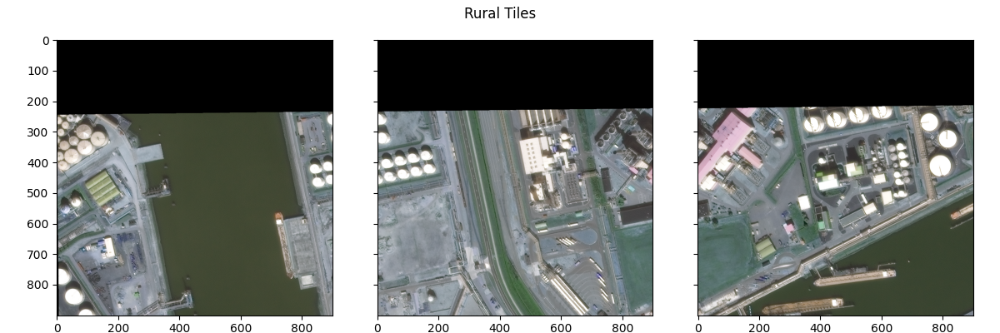

In [11]:
rural_temp = rural.take(3)

plt.clf()
rows, cols = 1, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 4), sharey=True)
fig.suptitle('Rural Tiles')

for i in range(cols):
    ax[i].imshow(rural_temp[i])
    
plt.tight_layout()
%matplot plt

<center><b>Figure 8. </b>Above are samples of rural map tiles which have a low building density.</center>

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

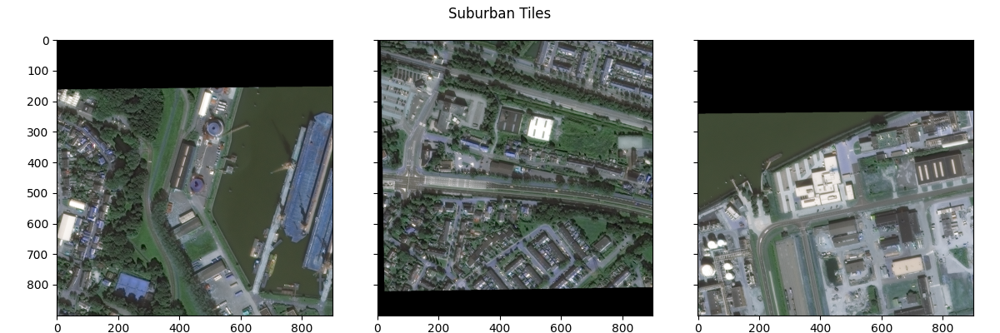

In [12]:
suburban_temp = suburban.take(3)

plt.clf()
rows, cols = 1, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 4), sharey=True)
fig.suptitle('Suburban Tiles')

for i in range(cols):
    ax[i].imshow(suburban_temp[i])
    
plt.tight_layout()
%matplot plt

<center><b>Figure 9. </b>Above are samples of suburban map tiles which have a medium building density.</center>

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

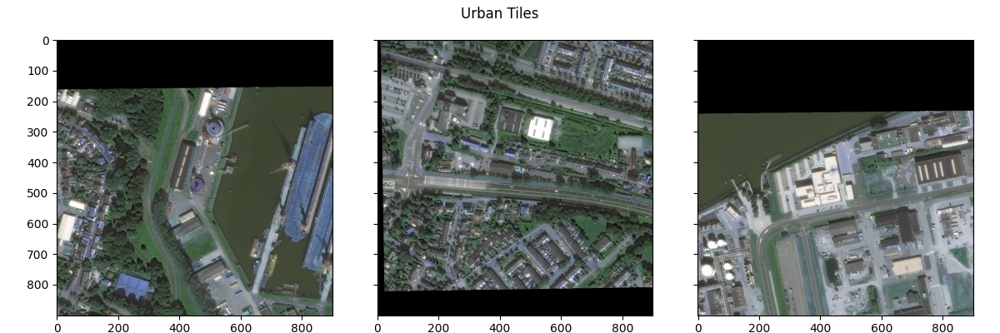

In [13]:
urban_temp = urban.take(3)

plt.clf()
rows, cols = 1, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 4), sharey=True)
fig.suptitle('Urban Tiles')

for i in range(cols):
    ax[i].imshow(suburban_temp[i])
    
plt.tight_layout()
%matplot plt

<center><b>Figure 10. </b>Above are samples of urban map tiles which have a high building density.</center>

### 6.3 Descriptive Analytics

Using the ground truth from the summary data, the authors categorized the map tiles based on their building densities. This sets the  groundwork to cross validate the methodology of applying image processing techniques for geospatial analytics.

### 6.4 Application of Image Processing Techniques

In this project, the authors will be applying several image processing techniques such as thresholding and blob detection to get a sense of urbanization within the map tiles.

#### 6.4.1 Thresholding

Thresholding is an image processing method that creates segmentations within images. It allows emphasis such as separating the foreground and background.

##### 1. Otsu Thresholding

Otsu’s method is a binarization technique used to perform thresholding to return an intensity that separates an image into a background and foreground. By applying this preprocessing steps to our map tiles, we can much more easily identify the structures (the foreground) from the background (land and terrain).

##### Sample Images

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

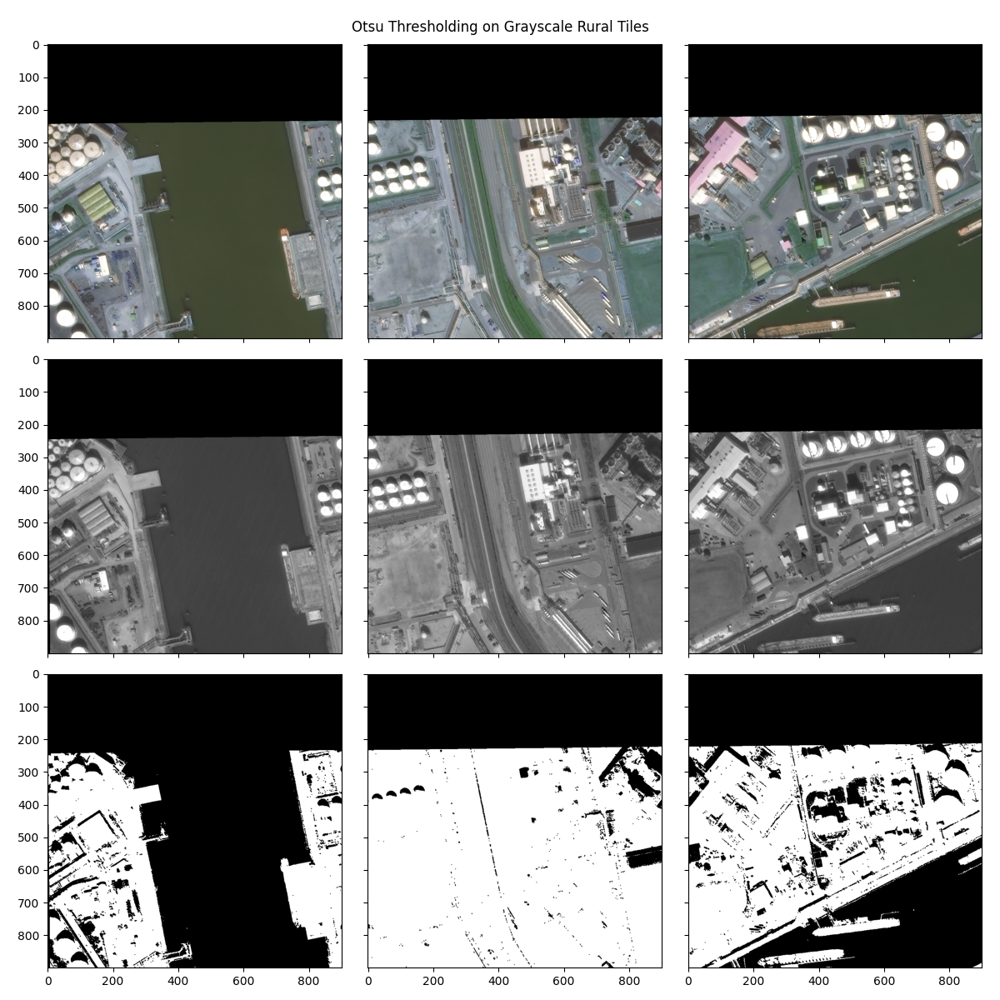

In [14]:
temp_gray = [rgb2gray(i) for i in rural_temp]
ostu_thresh = [filters.threshold_otsu(i) for i in temp_gray]

plt.clf()
rows, cols = 3, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 12), sharex=True, sharey=True)
fig.suptitle('Otsu Thresholding on Grayscale Rural Tiles')

for i in range(cols):
    ax[0][i].imshow(rural_temp[i])
    ax[1][i].imshow(erosion(temp_gray[i]*1.0), cmap='gray')
    ax[2][i].imshow(erosion(temp_gray[i] > ostu_thresh[i])*1.0, cmap='gray')

plt.tight_layout()
%matplot plt

<center><b>Figure 11. </b>By applying thresholding, we can see how the structures (in white) are separated from the terrain (in black). There is a bigger presence of black here for rural map tiles compared to suburban and urban maptiles.</center>

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

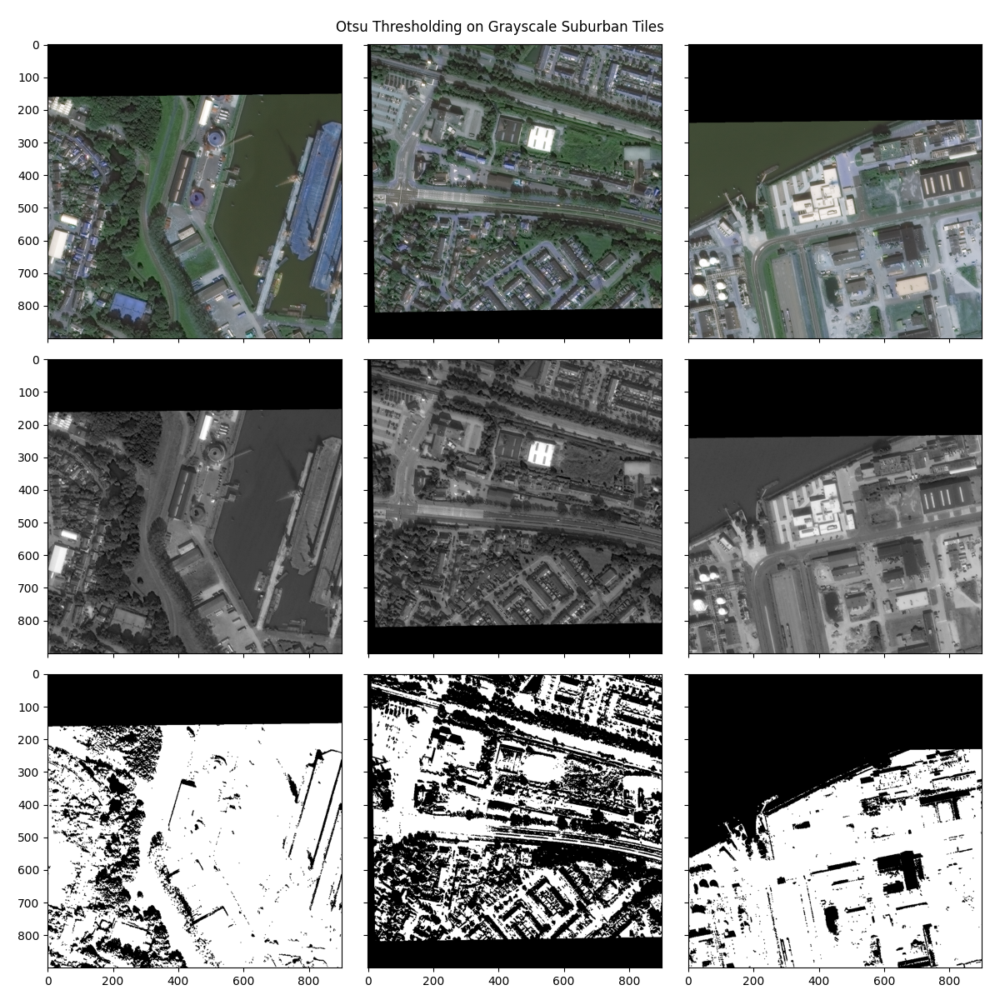

In [15]:
temp_gray = [rgb2gray(i) for i in suburban_temp]
ostu_thresh = [filters.threshold_otsu(i) for i in temp_gray]

plt.clf()
rows, cols = 3, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 12), sharex=True, sharey=True)
fig.suptitle('Otsu Thresholding on Grayscale Suburban Tiles')

for i in range(cols):
    ax[0][i].imshow(suburban_temp[i])
    ax[1][i].imshow(erosion(temp_gray[i]*1.0), cmap='gray')
    ax[2][i].imshow(erosion(temp_gray[i] > ostu_thresh[i])*1.0, cmap='gray')

plt.tight_layout()
%matplot plt

<center><b>Figure 12. </b>Compared to the rural maptiles, there is a bigger presence of white in suburban maptiles.</center>

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

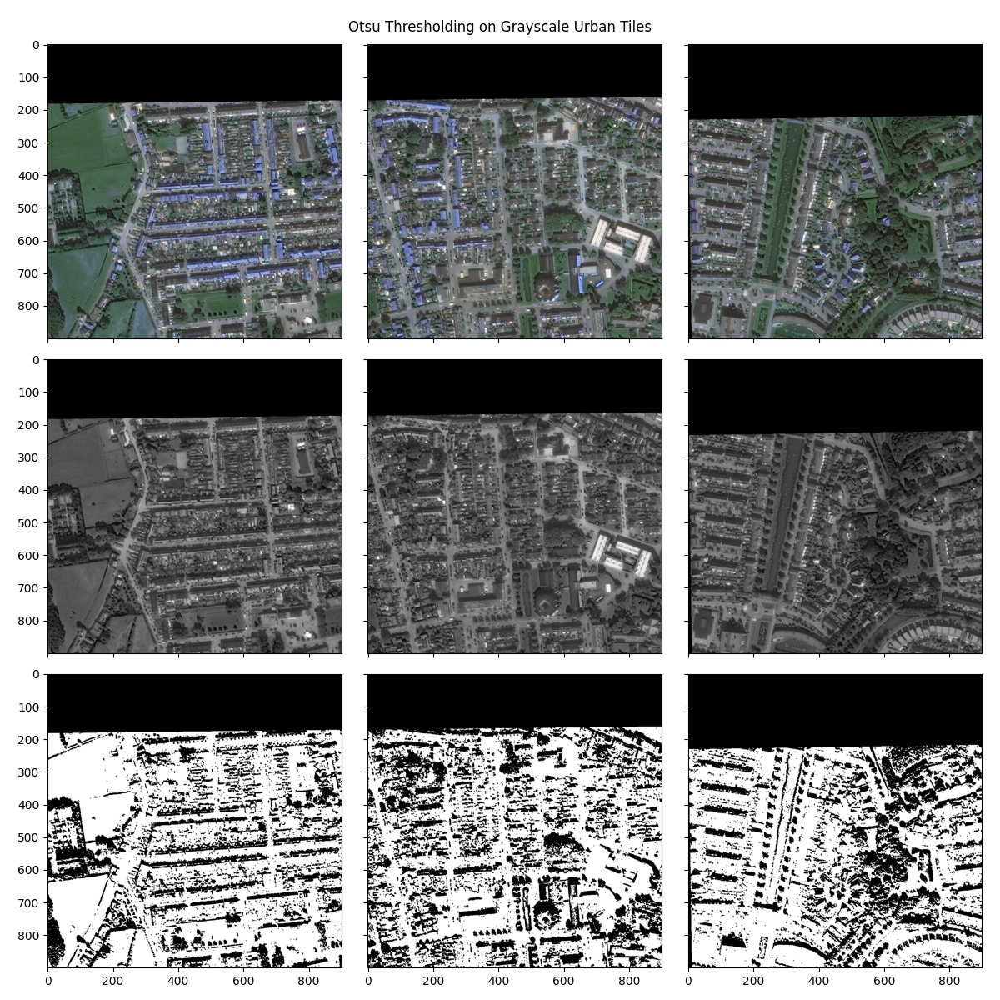

In [16]:
temp_gray = [rgb2gray(i) for i in urban_temp]
ostu_thresh = [filters.threshold_otsu(i) for i in temp_gray]

plt.clf()
rows, cols = 3, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 12), sharex=True, sharey=True)
fig.suptitle('Otsu Thresholding on Grayscale Urban Tiles')

for i in range(cols):
    ax[0][i].imshow(urban_temp[i])
    ax[1][i].imshow(erosion(temp_gray[i]*1.0), cmap='gray')
    ax[2][i].imshow(erosion(temp_gray[i] > ostu_thresh[i])*1.0, cmap='gray')

plt.tight_layout()
%matplot plt

<center><b>Figure 13. </b>In urban maptiles, most the the image is white with very little black.</center>

##### 2. Li Thresholding

This an alternative means of finding the optimal threshold to distinguish the background and the foreground by minimizing the cross-entropy between the foreground and its mean and the background and its mean. This is a more strict thresholding and would be best used to distinguish land and water bodies.

##### Sample Images

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

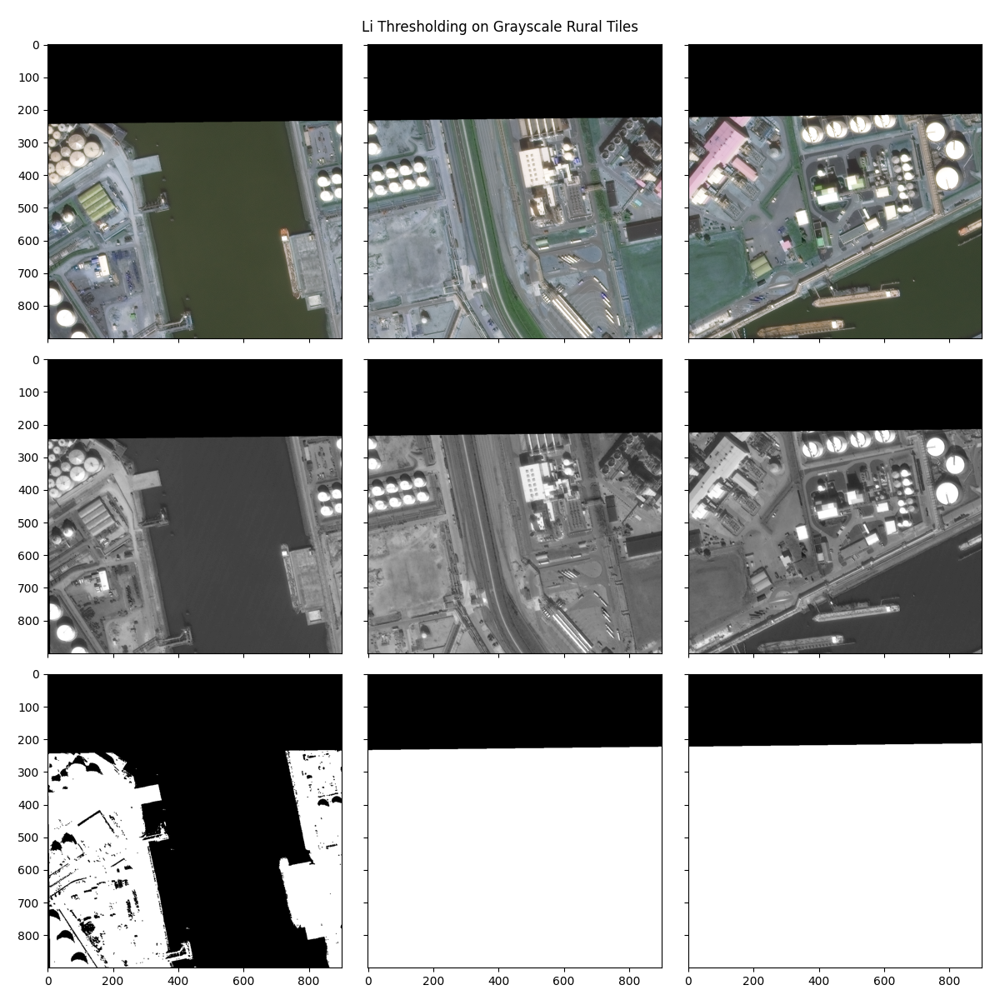

In [17]:
temp_gray = [rgb2gray(i) for i in rural_temp]
li_thresh = [filters.threshold_li(i) for i in temp_gray]

plt.clf()
rows, cols = 3, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 12), sharex=True, sharey=True)
fig.suptitle('Li Thresholding on Grayscale Rural Tiles')

for i in range(cols):
    ax[0][i].imshow(rural_temp[i])
    ax[1][i].imshow(erosion(temp_gray[i]*1.0), cmap='gray')
    ax[2][i].imshow(erosion(temp_gray[i] > li_thresh[i])*1.0, cmap='gray')

plt.tight_layout()
%matplot plt

<center><b>Figure 14. </b>Comapred to Otsu's method, Li thresholding almost whites out the entire image making it much more difficult to generate insights for building detection. However, this is more usedful for detecting land mass vs bodies of water.</center>

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

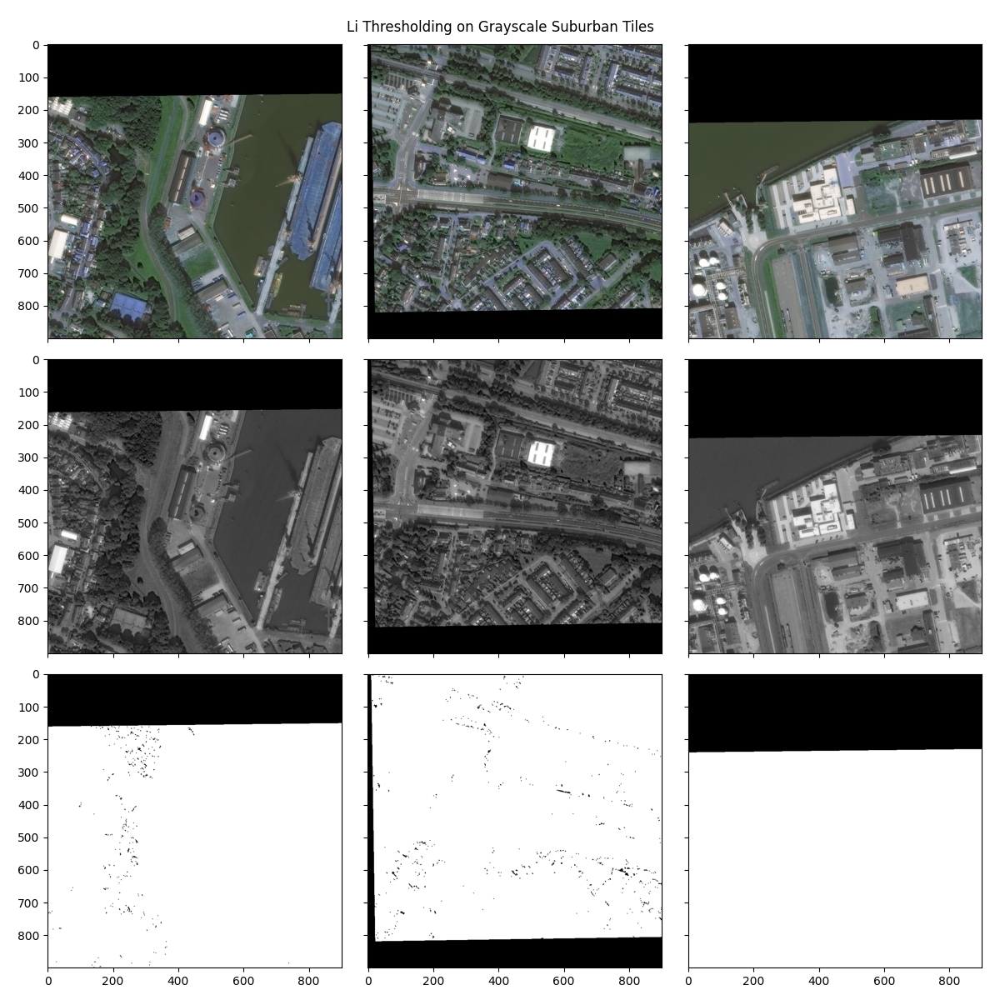

In [18]:
temp_gray = [rgb2gray(i) for i in suburban_temp]
li_thresh = [filters.threshold_li(i) for i in temp_gray]

plt.clf()
rows, cols = 3, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 12), sharex=True, sharey=True)
fig.suptitle('Li Thresholding on Grayscale Suburban Tiles')

for i in range(cols):
    ax[0][i].imshow(suburban_temp[i])
    ax[1][i].imshow(erosion(temp_gray[i]*1.0), cmap='gray')
    ax[2][i].imshow(erosion(temp_gray[i] > li_thresh[i])*1.0, cmap='gray')

plt.tight_layout()
%matplot plt

<center><b>Figure 15. </b>Compared to the rural map tiles, all the sample suburban map tiles were whited out expect for some feature noise in black.</center>

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

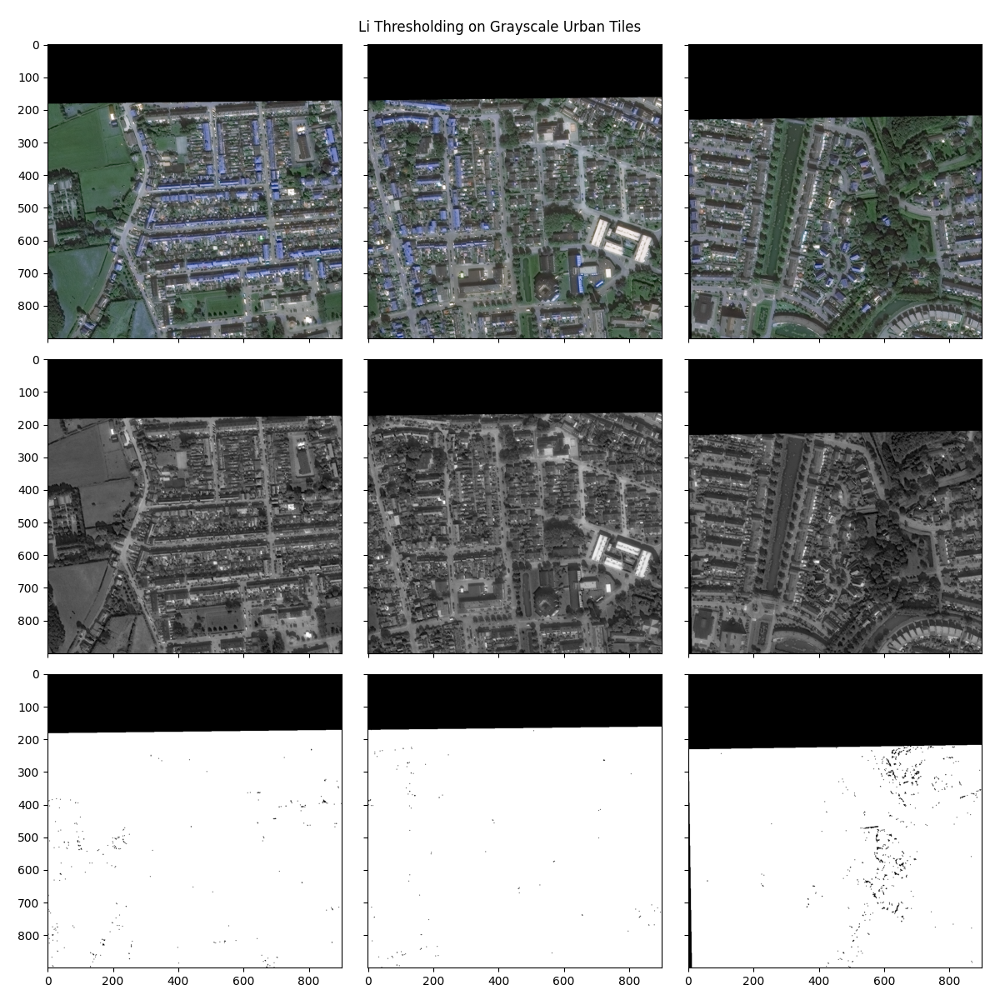

In [19]:
temp_gray = [rgb2gray(i) for i in urban_temp]
li_thresh = [filters.threshold_li(i) for i in temp_gray]

plt.clf()
rows, cols = 3, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 12), sharex=True, sharey=True)
fig.suptitle('Li Thresholding on Grayscale Urban Tiles')

for i in range(cols):
    ax[0][i].imshow(urban_temp[i])
    ax[1][i].imshow(erosion(temp_gray[i]*1.0), cmap='gray')
    ax[2][i].imshow(erosion(temp_gray[i] > li_thresh[i])*1.0, cmap='gray')

plt.tight_layout()
%matplot plt

<center><b>Figure 16. </b>Finally, the urban map tiles were also complete whited out expect for some noise in black.</center>

#### 6.4.2 Blob Detection

Blob Detection in images are methods of detecting regions in a digital image. For this project, the authors applied blob detection to detect the presence of structures within a map tile. The philosophy behind this is the use of blobs to detect buildings and building density in areas which can be used as a feature in future models.

#### Sample Images

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

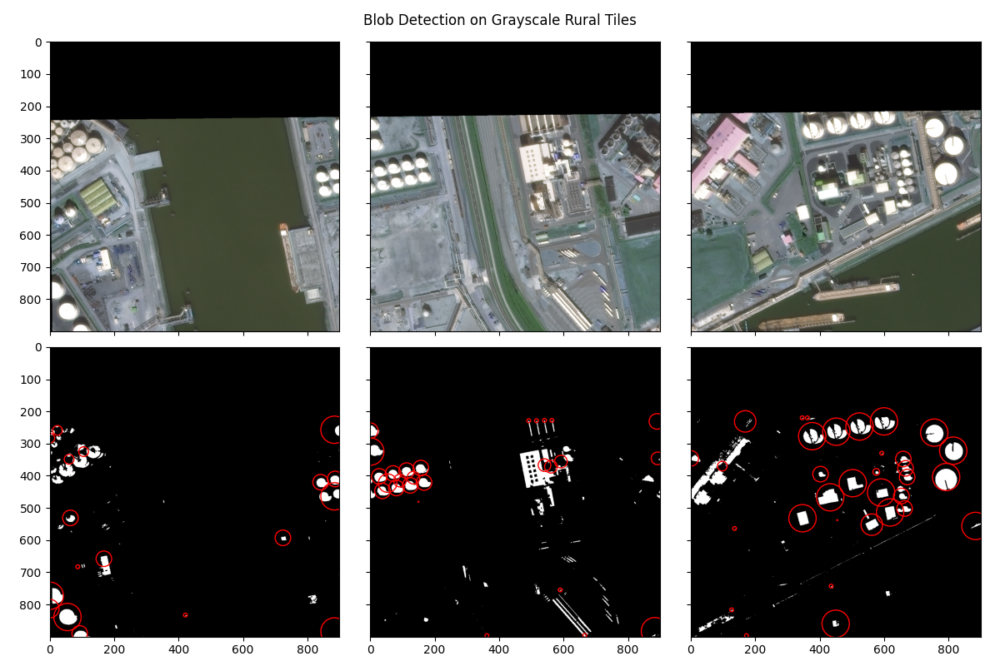

In [20]:
thresh = 0.8
temp_gray = [rgb2gray(i) for i in rural_temp]
blobs = [blob_doh(i) for i in temp_gray]

plt.clf()
rows, cols = 2, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 8), sharex=True, sharey=True)
fig.suptitle('Blob Detection on Grayscale Rural Tiles')

for i in range(cols):
    ax[0][i].imshow(rural_temp[i])
    ax[1][i].imshow(erosion(temp_gray[i] > thresh)*1.0, cmap='gray')
    for blob in blobs[i]:
        y, x, area = blob
        ax[1][i].add_patch(plt.Circle((x, y), area*np.sqrt(2),
                                      color='r', fill=False))
plt.tight_layout()
%matplot plt

<center><b>Figure 17. </b>With threasholding applied, the detected blobs which are represented in red circles, can serve as a means of detecting structures.</center>

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

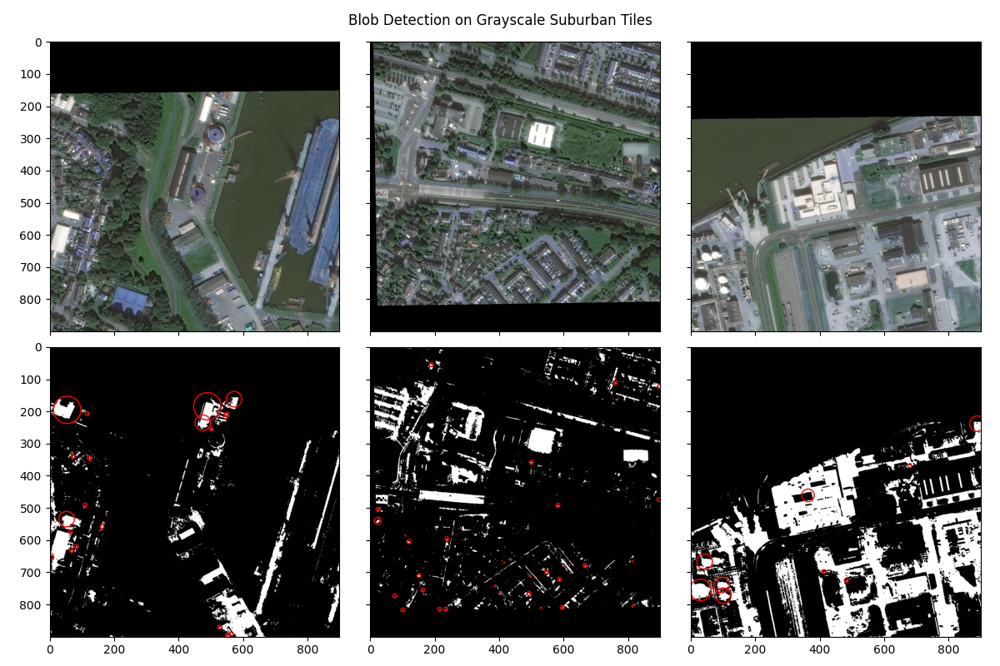

In [21]:
thresh = 0.5
temp_gray = [rgb2gray(i) for i in suburban_temp]
blobs = [blob_doh(i) for i in temp_gray]

plt.clf()
rows, cols = 2, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 8), sharex=True, sharey=True)
fig.suptitle('Blob Detection on Grayscale Suburban Tiles')

for i in range(cols):
    ax[0][i].imshow(suburban_temp[i])
    ax[1][i].imshow(erosion(temp_gray[i] > thresh)*1.0, cmap='gray')
    for blob in blobs[i]:
        y, x, area = blob
        ax[1][i].add_patch(plt.Circle((x, y), area*np.sqrt(2),
                                      color='r', fill=False))
plt.tight_layout()
%matplot plt

<center><b>Figure 18. </b>Due to the presence of more foreground (in white) than background (in black) for the suburban map tiles, blob detection is an alternative means of identifying structures within our map tiles.</center>

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

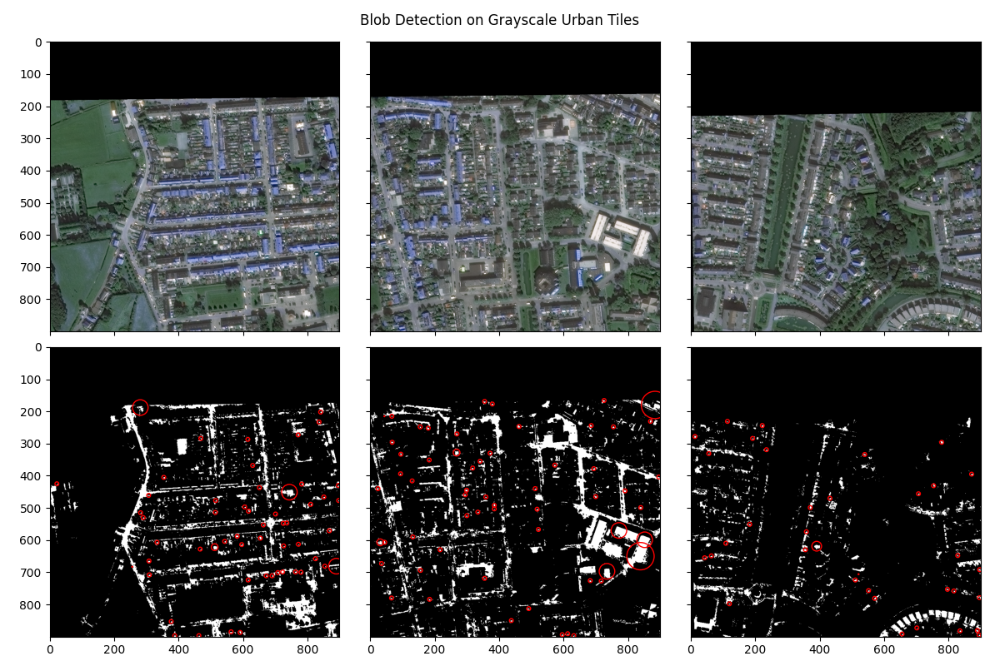

In [22]:
thresh = 0.5
temp_gray = [rgb2gray(i) for i in urban_temp]
blobs = [blob_doh(i) for i in temp_gray]

plt.clf()
rows, cols = 2, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 8), sharex=True, sharey=True)
fig.suptitle('Blob Detection on Grayscale Urban Tiles')

for i in range(cols):
    ax[0][i].imshow(urban_temp[i])
    ax[1][i].imshow(erosion(temp_gray[i] > thresh)*1.0, cmap='gray')
    for blob in blobs[i]:
        y, x, area = blob
        ax[1][i].add_patch(plt.Circle((x, y), area*np.sqrt(2),
                                      color='r', fill=False))
plt.tight_layout()
%matplot plt

<center><b>Figure 19. </b>Finally, the urban map tiles have many clusters present in its plot.</center>

## 7. Results and Discussion 

The categorized image tiles based on building density per tile produced a count of 1948 rural map tiles, 1249 suburban map tiles, and 204 urban map tiles. Otsu Thresholding produced the best binarization of images that produced a noticeable distinction between the structures and terrain. Lastly, blob detection techniques combined with thresholding detected structures in a distribution aligned with the ground truth summary.

### 7.1 Determination of Optimal Thresholding for Each Type of Area

By utilizing pyspark, the authors were able to apply thresholding algorithms throughout the entire dataset. This preprocessing allowed us to get the optimal threshold value to apply to all the map tiles. Even with the use of clusters, there was still significant wait time when processing the images due to the large dataset.

#### 1. Otsu Threshold

Using Otsu's method, it seems like the optimal value would be between 0.23 to 0.24. The threshold seems to be consistent throughout the dataset without any differentiation needed between the categories.

In [23]:
def apply_ostu(tiles):
    """Apply greyscale then determine optimal ostu threshold."""
    return (tiles.map(lambda x: rgb2gray(x))
            .map(lambda x: filters.threshold_otsu(x))
           ).collect()

rural_otsu = apply_ostu(rural)
suburban_otsu = apply_ostu(suburban)
urban_otsu = apply_ostu(urban)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

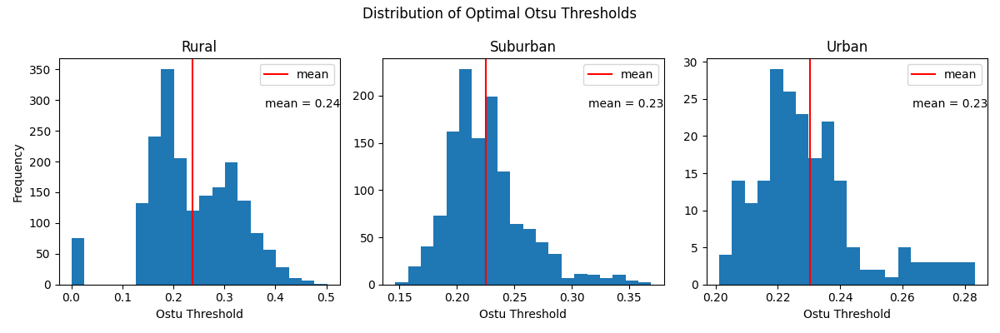

In [55]:
plt.clf()
rows, cols = 1, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 4))
fig.suptitle('Distribution of Optimal Otsu Thresholds')

ax[0].hist(rural_otsu, bins=20)
ax[0].set_xlabel('Ostu Threshold')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Rural')
ax[0].axvline(np.mean(rural_otsu), c='red', label='mean')
ax[0].text(1, 0.8, 'mean = {}'.format(round(np.mean(rural_otsu), 2)),
           horizontalalignment='right', verticalalignment='center',
           transform=ax[0].transAxes)
ax[0].legend()

ax[1].hist(suburban_otsu, bins=20)
ax[1].set_xlabel('Ostu Threshold')
ax[1].set_title('Suburban')
ax[1].axvline(np.mean(suburban_otsu), c='red', label='mean')
ax[1].text(1, 0.8, 'mean = {}'.format(round(np.mean(suburban_otsu), 2)),
           horizontalalignment='right', verticalalignment='center',
           transform=ax[1].transAxes)
ax[1].legend()

ax[2].hist(urban_otsu, bins=20)
ax[2].set_xlabel('Ostu Threshold')
ax[2].set_title('Urban')
ax[2].axvline(np.mean(urban_otsu), c='red', label='mean')
ax[2].text(1, 0.8, 'mean = {}'.format(round(np.mean(urban_otsu), 2)),
           horizontalalignment='right', verticalalignment='center',
           transform=ax[2].transAxes)
ax[2].legend()

plt.tight_layout()
%matplot plt

<center><b>Figure 20. </b>The mean value for Otsu's value lies around from 0.23 to 0.24 for different levels of urbanization.</center>

#### 2. Li Threshold

Similar to Otsu's method, the Li Threshold throughout the dataset produced a consistent throughout the dataset without any differentiation needed between the categories. However, the value produced is much lower at 0.04. Based on visual assessment, Otsu's method produced a much better result.

In [56]:
def apply_li(tiles):
    """Apply greyscale then determine optimal li threshold."""
    return (tiles.map(lambda x: rgb2gray(x))
            .map(lambda x: filters.threshold_li(x))
           ).collect()

rural_li = apply_li(rural)
suburban_li = apply_li(suburban)
urban_li = apply_li(urban)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

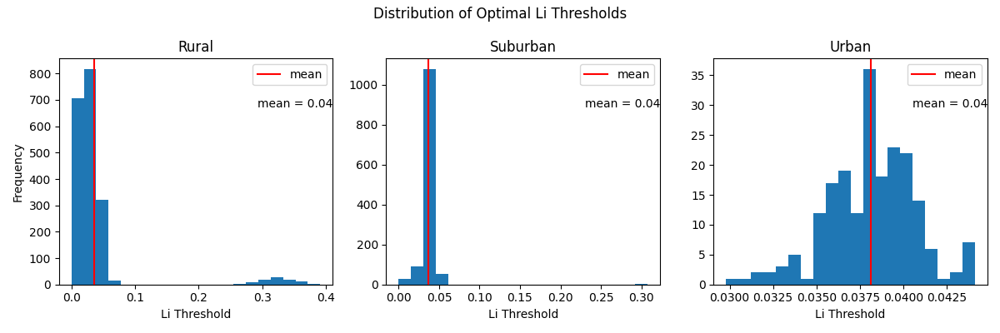

In [58]:
plt.clf()
rows, cols = 1, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 4))
fig.suptitle('Distribution of Optimal Li Thresholds')

ax[0].hist(rural_li, bins=20)
ax[0].set_xlabel('Li Threshold')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Rural')
ax[0].axvline(np.mean(rural_li), c='red', label='mean')
ax[0].text(1, 0.8, 'mean = {}'.format(round(np.mean(rural_li), 2)),
           horizontalalignment='right', verticalalignment='center',
           transform=ax[0].transAxes)
ax[0].legend()

ax[1].hist(suburban_li, bins=20)
ax[1].set_xlabel('Li Threshold')
ax[1].set_title('Suburban')
ax[1].axvline(np.mean(suburban_li), c='red', label='mean')
ax[1].text(1, 0.8, 'mean = {}'.format(round(np.mean(suburban_li), 2)),
           horizontalalignment='right', verticalalignment='center',
           transform=ax[1].transAxes)
ax[1].legend()

ax[2].hist(urban_li, bins=20)
ax[2].set_xlabel('Li Threshold')
ax[2].set_title('Urban')
ax[2].axvline(np.mean(urban_li), c='red', label='mean')
ax[2].text(1, 0.8, 'mean = {}'.format(round(np.mean(urban_li), 2)),
           horizontalalignment='right', verticalalignment='center',
           transform=ax[2].transAxes)
ax[2].legend()

plt.tight_layout()
%matplot plt

<center><b>Figure 21. </b>The mean value for Li's value lies at 0.04 for different levels of urbanization.</center>

### 7.2 Distribution of Blobs for Each Type of Area

Using thresholding along with the Determinant of Hessian blob detection algorithm, chosen for computational efficiency, the distribution of blobs amongst the map tiles are aligned with the distribution of building density according to the ground truth in the summary file. Meaning, we observe that the most number of buildings are in urban tiles with relatively high values from the other two. The rural and urban tiles are lower but closer in range to each other as well. This is reflective of the ground truth set by the summary data.

In [59]:
def generate_len_blobs(
    tiles, thresh=0.8, blob_func=blob_doh, min_sigma=1, max_sigma=30):
    """Determine number of blobs for each image for a sample."""
    return (tiles.map(lambda x: rgb2gray(x))
            .map(lambda x: x > thresh)
            .map(lambda x: blob_func(x, min_sigma=min_sigma,
                                     max_sigma=max_sigma).shape[0])
           ).take(200)

rural_blobs = generate_len_blobs(rural, min_sigma=3)
suburban_blobs = generate_len_blobs(suburban, min_sigma=3)
urban_blobs = generate_len_blobs(urban, min_sigma=3)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

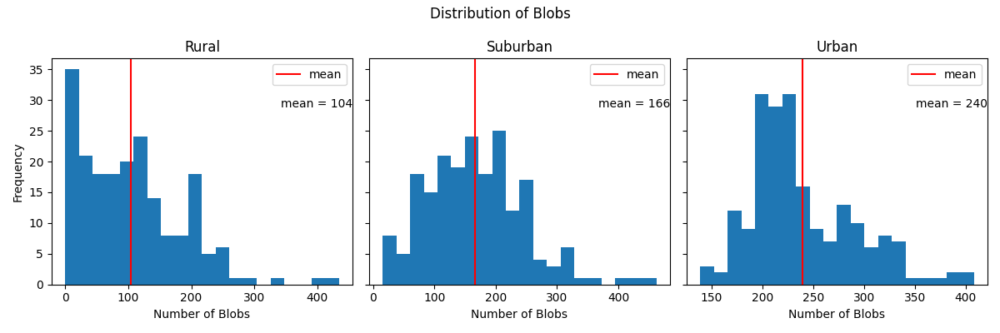

In [61]:
plt.clf()
rows, cols = 1, 3
fig, ax = plt.subplots(rows, cols, figsize=(12, 4), sharey=True)
fig.suptitle('Distribution of Blobs')

ax[0].hist(rural_blobs, bins=20)
ax[0].set_xlabel('Number of Blobs')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Rural')
ax[0].axvline(np.mean(rural_blobs), c='red', label='mean')
ax[0].text(1, 0.8, 'mean = {}'.format(round(np.mean(rural_blobs))),
           horizontalalignment='right', verticalalignment='center',
           transform=ax[0].transAxes)
ax[0].legend()

ax[1].hist(suburban_blobs, bins=20)
ax[1].set_xlabel('Number of Blobs')
ax[1].set_title('Suburban')
ax[1].axvline(np.mean(suburban_blobs), c='red', label='mean')
ax[1].text(1, 0.8, 'mean = {}'.format(round(np.mean(suburban_blobs))),
           horizontalalignment='right', verticalalignment='center',
           transform=ax[1].transAxes)
ax[1].legend()

ax[2].hist(urban_blobs, bins=20)
ax[2].set_xlabel('Number of Blobs')
ax[2].set_title('Urban')
ax[2].axvline(np.mean(urban_blobs), c='red', label='mean')
ax[2].text(1, 0.8, 'mean = {}'.format(round(np.mean(urban_blobs))),
           horizontalalignment='right', verticalalignment='center',
           transform=ax[2].transAxes)
ax[2].legend()

plt.tight_layout()
%matplot plt

<center><b>Figure 22. </b>The number of blobs for the rural map tiles lie at 104, for suburban at 166, and for urban at 240. The distributuions correspond to the ground truth.</center>

## 8. Conclusion

Pyspark presented several challenges when working with image files. In order to work with the images, .tif files needed to be converted in byte arrays, then numpy arrays, then finally decoded using opencv in order to be used in pyspark mapping functions. Another potential challenge is arranging the images properly, since each tile is part of a whole map and pyspark doesn’t necessarily collect images in the order they are fed into the pipeline. Due to the large number of map tiles that would make up a large area, pyspark’s parallelization necessitates the need for its use in practical and efficient pipelines. However, the scope for this project ends by applying image preprocessing steps to prepare it for feature extraction in convolutional machine learning models.

In terms of otsu and li thresholding, we observe similar values across the three levels of urbanization. This can be attributed to the dataset and its consistency which reduces constrast between the foreground and background. Blobs detected are a good start in terms of detecting buildings given that they follow a similar distribution to the number of buildings that was also present in the ground truth.

## 9. Recommendations

To actualize the full use of this methodology, the pipeline should continue to implement machine learning models, geospatial analytics, or other analytic methods to produce insights. In particular, RasterFrames is a geospacial analytics package which is usable with pyspark.

More thresholding methods are also available. The ones presented here are only two of numerous and available on skicit-image. In terms of blob detection, parameter tuning and other methods are also available to be done for future study. Chaining these will also be effective in terms of determining the optimal features for the use case needed. In this case, with building detection, the use of ostu method and blob detection would definitely be a good place to begin.

Erosion, a morphological image processing technique to reduce shapes contained in the input image, is also an available preprocessing technique. In this project, the authors use erosion to clean up images for cleaner separations of shapes which could be potential structures in a map tile. Dilation, a morphological image processing technique to expand shapes contained in the input image, is also available. In this project, the authors use dilation to fill up separation within shapes which could be potential structures in a map tile. There were specifically used to create better graphs however, were not implemented in the distributions. These can also be chained in a pipeline with the other methods to produce a more consistent output. We also suggest some form of contrast increase to better the thresholding methods used.


### 9.1 Limitations

The AWS environment proved to be challenging in installing packages such as RasterFrames or RasterIO and needs further study to implement, but it is a good option to explore in the interest of expanding this project. There were also computational limitations with the use of EMRs. Since only 16GB of RAM was available and a limited number of instances could be reserved to an account at a time, the authors opted to use sampling for blob detection. The use of other methods was also considered however not implemented as well.

## References

Anastasia Murzova, Sakshi Seth, Murzova, A., &amp; Seth, S. (2021, May 5). Otsu's Thresholding Technique. LearnOpenCV. Retrieved March 8, 2022, from https://learnopencv.com/otsu-thresholding-with-opencv/ 

Blob detection¶. Blob Detection - skimage v0.19.2 docs. (n.d.). Retrieved March 7, 2022, from https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_blob.html#sphx-glr-auto-examples-features-detection-plot-blob-py 

Caubalejo, R. (2021, January 31). Image processing - blob detection. Medium. Retrieved March 8, 2022, from https://towardsdatascience.com/image-processing-blob-detection-204dc6428dd 

Czehnder. (2020, February 14). Czehnder. spacenetai. Retrieved March 7, 2022, from https://spacenet.ai/sn6-challenge/ 

Gilmour, J. B., Lui, A. W., &amp; Briggs, D. C. (1986). EMR. Amazon. Retrieved March 7, 2022, from https://docs.aws.amazon.com/emr/ 

Li Thresholding¶. Li thresholding - skimage v0.19.2 docs. (n.d.). Retrieved March 7, 2022, from https://scikit-image.org/docs/stable/auto_examples/developers/plot_threshold_li.html#sphx-glr-auto-examples-developers-plot-threshold-li-py 

Strand Street Press. (2002). S3. Amazon. Retrieved March 7, 2022, from https://docs.aws.amazon.com/s3/index.html 

Thresholding¶. Thresholding - skimage v0.19.2 docs. (n.d.). Retrieved March 7, 2022, from https://scikit-
image.org/docs/stable/auto_examples/applications/plot_thresholding.html#sphx-glr-auto-examples-applications-plot-thresholding-py 